# Comments on this document
This is the main file for the data handling and manipulation. All tasks are carried out in external functions in separate .py files to keep it clear.

In [1]:
# import the required packages. Add more if necessary
import pandas as pd # data processing
import numpy as np # data processing
import matplotlib.pyplot as plt # create plots
import plotly.graph_objects as go # create interactive plots
import os # interaction with operating system

import Data_Import
import Data_Cleaning
import Data_Visualization
import Helper

In [2]:
## You don't need to change this cell. Always reloads modules (external functions) when cell is executed so that the newest version is used
%load_ext autoreload
%autoreload 2

In [3]:
# Adjust this cell with your preferences
# Settings of plots
figSize = [15, 9] # size of figures
fontSize = 15 # Size of numbers and text in plots
lineWidth = 2 # linewidth in plots

# adapts the plot settings for all future plots
plt.rcParams['figure.figsize'] = figSize
plt.rcParams['font.size'] = fontSize
plt.rcParams['lines.linewidth'] = lineWidth

path_to_data_folder = 'Data' # Provide the path to the folder containing the data for Assignment 2 and 3
latest_data_directory = 'wabesense_discharge_2023-09-01'

path_to_plot_folder = 'Plots' # Enter a name for the folder where the plots will be saved
plotFileType = 'pdf' # 'pdf' or 'png'; filetype for the plots

if not os.path.isdir(path_to_plot_folder): # creates the folder if it does not exist yet
    os.makedirs(path_to_plot_folder)

In [4]:
# load the spring data into a list of dataframes
spring_names, spring_description, spring_data_paths, spring_data_dfs = Data_Import.import_spring_data(
    os.path.join(path_to_data_folder, latest_data_directory))

In [6]:
# clean data: keep only valid data range
valid_spring_data_dfs = []
for df in spring_data_dfs:
    valid_spring_data_dfs.append(Data_Cleaning.keep_only_valid_data(df))

In [7]:
valid_spring_data_dfs[0].head()

,valid,temperature(C),discharge(L/min)
datetime,,,
2022-11-02 08:24:33.023000+00:00,True,9.6,84.4
2022-11-02 08:34:33.023000+00:00,True,9.5,70.6
2022-11-02 08:44:33.023000+00:00,True,9.5,82.0
2022-11-02 08:54:33.023000+00:00,True,9.5,80.7
2022-11-02 09:04:33.023000+00:00,True,9.4,79.7


In [12]:
fig_all_springs_go = Data_Visualization.plot_interactive_figure(valid_spring_data_dfs[0:4], spring_names[0:4])
fig_all_springs_go

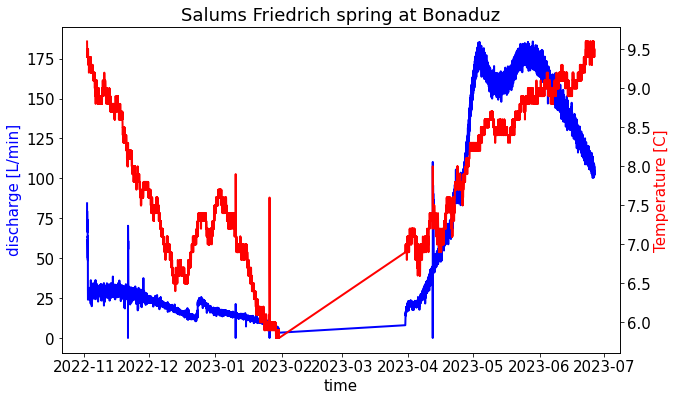

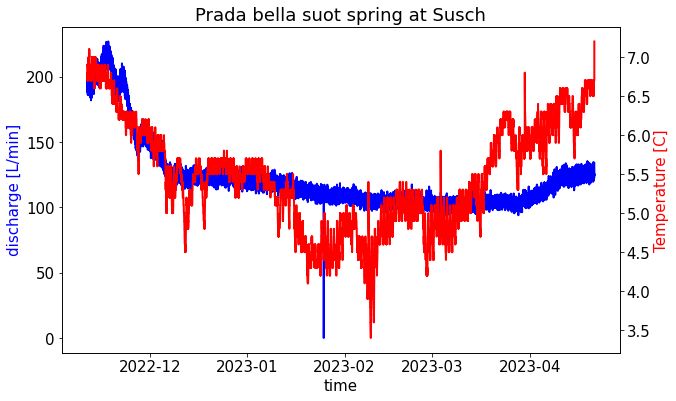

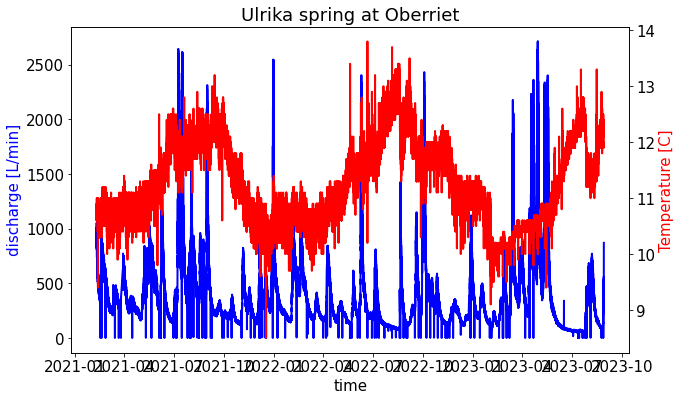

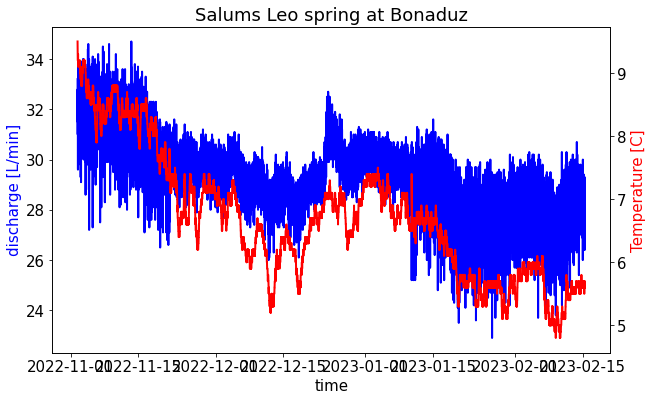

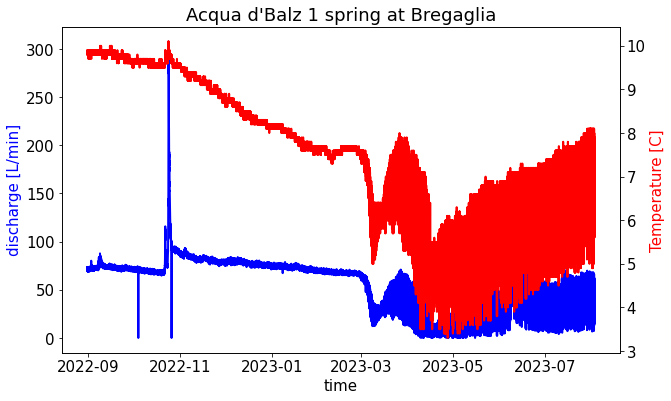

...

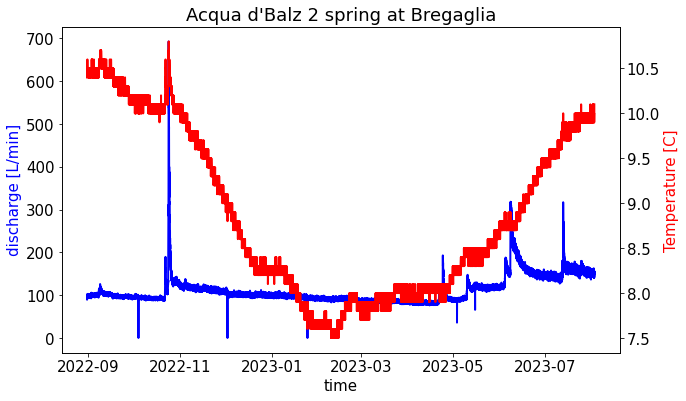

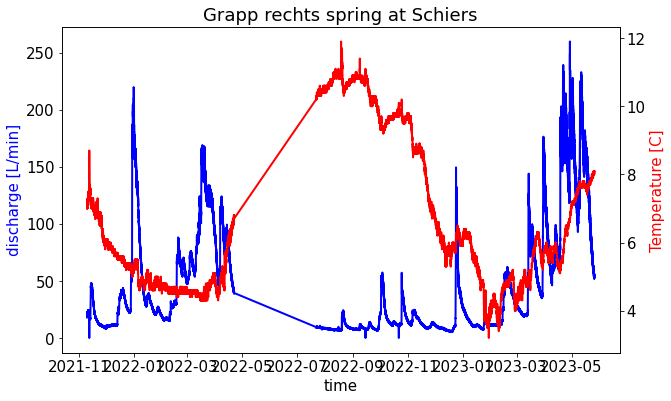

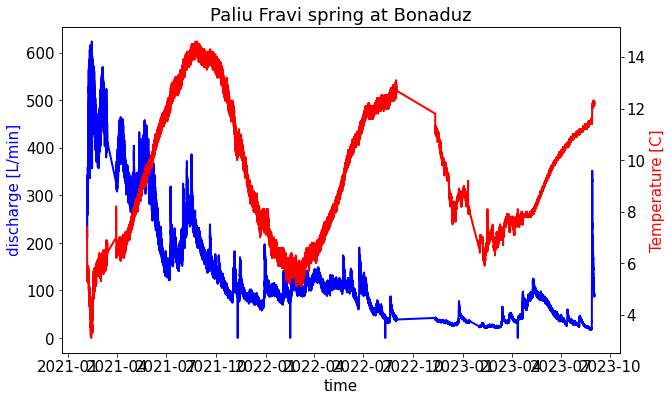

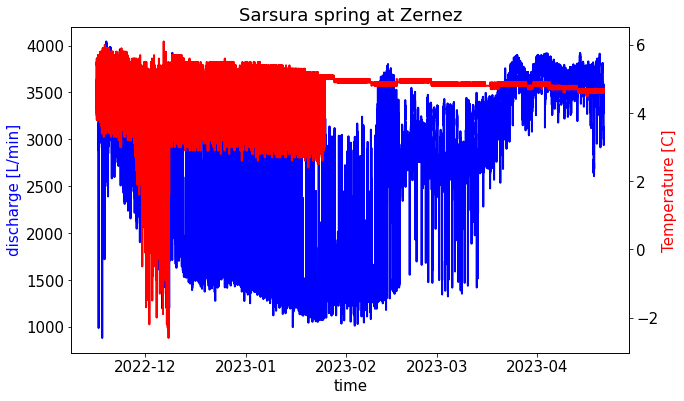

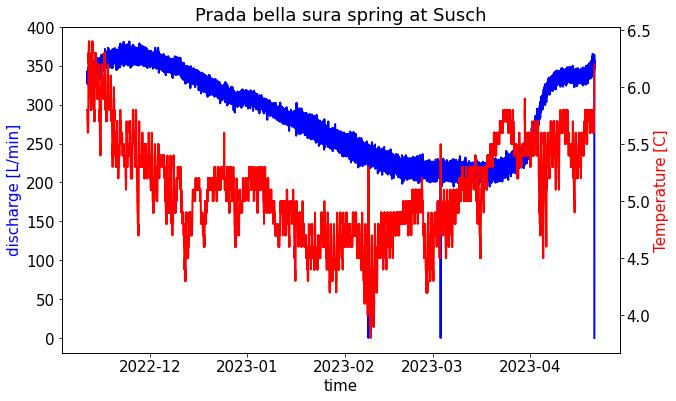

In [13]:
for i in range(0, len(valid_spring_data_dfs)):
    fig_single_spring = Data_Visualization.plot_single_spring(valid_spring_data_dfs[i], spring_description[i])
    fig_single_spring.savefig(os.path.join(path_to_plot_folder, '{}.{}'.format(spring_names[i], plotFileType)))